In [79]:
# !pip install ta
# !pip install statsmodels
# !pip install plotly
# !pip install pmdarima

In [80]:
import pandas as pd
import numpy as np
import ta
import plotly.express as px
import statsmodels.tsa.stattools as ts
import statsmodels.graphics.tsaplots as sgt
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error

In [81]:
df_hourly =pd.read_csv("/content/EURUSD1hour.csv")

In [82]:
df_hourly.head()

,date,time,open,high,low,close,volume
0,2010.05.04,00:00,1.31884,1.31981,1.31853,1.31980,750
1,2010.05.04,01:00,1.31982,1.32004,1.31885,1.31942,626
2,2010.05.04,02:00,1.31947,1.32120,1.31915,1.32083,954
3,2010.05.04,03:00,1.32084,1.32131,1.31970,1.32073,896
4,2010.05.04,04:00,1.32076,1.32122,1.31928,1.32013,893


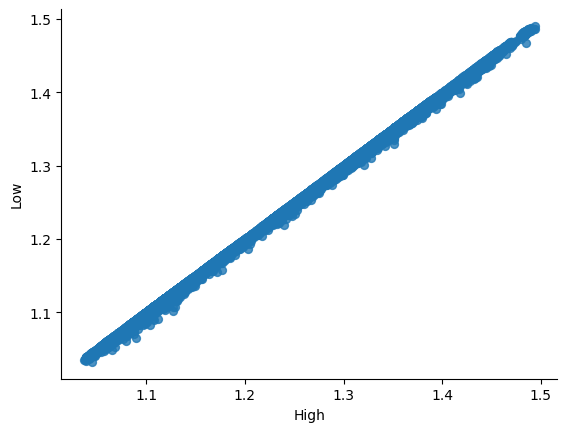

In [120]:
#High vs Low

from matplotlib import pyplot as plt
df_hourly.plot(kind='scatter', x='High', y='Low', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [83]:
headers = ['Date','Time','Open', 'High', 'Low', 'Close', 'Volume']
df_hourly.columns = headers

In [84]:
df_hourly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64921 entries, 0 to 64920
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    64921 non-null  object 
 1   Time    64921 non-null  object 
 2   Open    64921 non-null  float64
 3   High    64921 non-null  float64
 4   Low     64921 non-null  float64
 5   Close   64921 non-null  float64
 6   Volume  64921 non-null  int64  
dtypes: float64(4), int64(1), object(2)
memory usage: 3.5+ MB


In [85]:
df_hourly['Date'] = pd.to_datetime(df_hourly['Date'])

## Date vs Closing Price


In [86]:
fig = px.line(df_hourly, x='Date', y=['Close'])
fig.show()

##ARIMA MODEL Approach

Upon visual inspection we conclude the data is not stationary

In [87]:
def adf_test(timeseries):
    """
    Performs an Augmented Dickey-Fuller test and prints the results.

    Args:
        timeseries (pd.Series): The time series data to test.

    Returns:
        None
    """
    print ('Results of Dickey-Fuller Test:')
    dftest = ts.adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)

In [88]:
adf_test(df_hourly['Close'])

Results of Dickey-Fuller Test:
Test Statistic                    -1.714895
p-value                            0.423455
#Lags Used                         0.000000
Number of Observations Used    64920.000000
Critical Value (1%)               -3.430451
Critical Value (5%)               -2.861585
Critical Value (10%)              -2.566794
dtype: float64


Seeing the reulst of the Augemnted Dickey Fuller test we can conclude that the Data is not stationary.

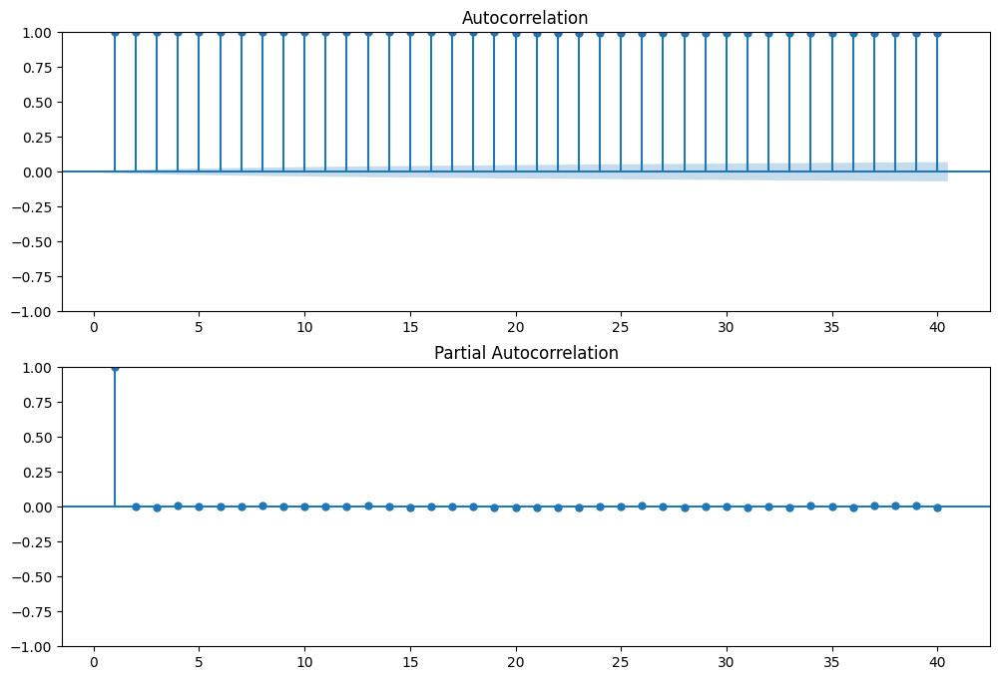

In [89]:
#ACF
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sgt.plot_acf(df_hourly['Close'], lags = 40, zero = False, ax=ax1)

#PACF
ax2 = fig.add_subplot(212)
fig = sgt.plot_pacf(df_hourly['Close'], lags = 40, zero = False, ax=ax2)
plt.show()

Here we can see that all values of the acf plot are showing significant effect

In [90]:
# Adding SMA
df_hourly['SMA_20'] = ta.trend.SMAIndicator(df_hourly['Close'], window=20).sma_indicator()

# Adding EMA
df_hourly['EMA_20'] = ta.trend.EMAIndicator(df_hourly['Close'], window=20).ema_indicator()

# Adding RSI
df_hourly['RSI'] = ta.momentum.RSIIndicator(df_hourly['Close'], window=14).rsi()

# Adding MACD
macd = ta.trend.MACD(df_hourly['Close'])
df_hourly['MACD'] = macd.macd()
df_hourly['MACD_signal'] = macd.macd_signal()
df_hourly['MACD_hist'] = macd.macd_diff()

# Adding Bollinger Bands
bb = ta.volatility.BollingerBands(df_hourly['Close'], window=20, window_dev=2)
df_hourly['BB_upper'] = bb.bollinger_hband()
df_hourly['BB_middle'] = bb.bollinger_mavg()
df_hourly['BB_lower'] = bb.bollinger_lband()

# Adding ATR
df_hourly['ATR'] = ta.volatility.AverageTrueRange(df_hourly['High'], df_hourly['Low'], df_hourly['Close'], window=14).average_true_range()

# Adding Stochastic Oscillator (Stoch)
stoch = ta.momentum.StochasticOscillator(df_hourly['High'], df_hourly['Low'], df_hourly['Close'], window=14, smooth_window=3)
df_hourly['STOCH_k'] = stoch.stoch()
df_hourly['STOCH_d'] = stoch.stoch_signal()

In [91]:
df_hourly.head()

,Date,Time,Open,High,Low,Close,Volume,SMA_20,EMA_20,RSI,MACD,MACD_signal,MACD_hist,BB_upper,BB_middle,BB_lower,ATR,STOCH_k,STOCH_d
0,2010-05-04,00:00,1.31884,1.31981,1.31853,1.31980,750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
1,2010-05-04,01:00,1.31982,1.32004,1.31885,1.31942,626,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
2,2010-05-04,02:00,1.31947,1.32120,1.31915,1.32083,954,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
3,2010-05-04,03:00,1.32084,1.32131,1.31970,1.32073,896,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
4,2010-05-04,04:00,1.32076,1.32122,1.31928,1.32013,893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN


In [92]:
df_hourly.dropna(inplace=True)

In [93]:
df_hourly.tail()

,Date,Time,Open,High,Low,Close,Volume,SMA_20,EMA_20,RSI,MACD,MACD_signal,MACD_hist,BB_upper,BB_middle,BB_lower,ATR,STOCH_k,STOCH_d
64916,2020-10-20,19:00,1.18231,1.18317,1.18193,1.18263,1677,1.179010,1.179611,70.789037,0.001805,0.001493,0.000312,1.183559,1.179010,1.174460,0.001372,82.200247,82.529872
64917,2020-10-20,20:00,1.18263,1.18359,1.18263,1.18316,1128,1.179336,1.179949,72.387976,0.001865,0.001567,0.000297,1.184089,1.179336,1.174583,0.001342,88.751545,83.065513
64918,2020-10-20,21:00,1.18315,1.18345,1.18260,1.18270,982,1.179631,1.180211,68.864680,0.001854,0.001625,0.000229,1.184449,1.179631,1.174814,0.001307,83.065513,84.672435
64919,2020-10-20,22:00,1.18270,1.18297,1.18219,1.18242,1616,1.179912,1.180421,66.735442,0.001802,0.001660,0.000142,1.184693,1.179912,1.175130,0.001270,79.604450,83.807169
64920,2020-10-20,23:00,1.18241,1.18268,1.18192,1.18211,842,1.180143,1.180582,64.362702,0.001716,0.001671,0.000044,1.184880,1.180143,1.175406,0.001233,75.772559,79.480841


In [94]:
exog_columns = ['SMA_20', 'EMA_20', 'RSI', 'MACD', 'MACD_signal', 'BB_upper', 'BB_middle', 'BB_lower', 'ATR', 'STOCH_k', 'STOCH_d']

# Define your endogenous variable (e.g., the target variable - Close prices)
y = df_hourly['Close']

# Define exogenous variables (technical indicators)
X = df_hourly[exog_columns]

In [95]:
# Split the dataset (95% train, 5% test)
train_size = int(len(df_hourly) * 0.95)
y_train, y_test = y[:train_size], y[train_size:]
X_train, X_test = X[:train_size], X[train_size:]

In [96]:
# Use pmdarima's auto_arima to find the best (p,d,q) for ARIMAX model
# Allow auto_arima to handle differencing if needed (d parameter)
arimax_model = auto_arima(y_train, exogenous=X_train, start_p=1, start_q=1,
                          max_p=5, max_q=5, m=1, seasonal=False,
                          d=None,  # Allow it to automatically determine differencing
                          trace=True, error_action='ignore',
                          suppress_warnings=True, stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-634205.292, Time=27.71 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-634209.292, Time=10.62 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-634207.372, Time=17.36 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-634207.371, Time=23.31 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-634210.974, Time=2.86 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 81.880 seconds


In [97]:
print(arimax_model.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                61643
Model:               SARIMAX(0, 1, 0)   Log Likelihood              317106.487
Date:                Mon, 14 Oct 2024   AIC                        -634210.974
Time:                        04:48:01   BIC                        -634201.944
Sample:                             0   HQIC                       -634208.172
                              - 61643                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.992e-06   4.09e-09    487.237      0.000    1.98e-06       2e-06
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):            461456.32
Prob(Q):                              0.78   Pr

In [98]:
arimax_model.fit(y_train, exogenous=X_train)

ARIMA(order=(0, 1, 0), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

In [99]:
# Make predictions on the test set
y_pred = arimax_model.predict(n_periods=len(y_test), exogenous=X_test)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:837: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



In [100]:
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 0.003552021234822813


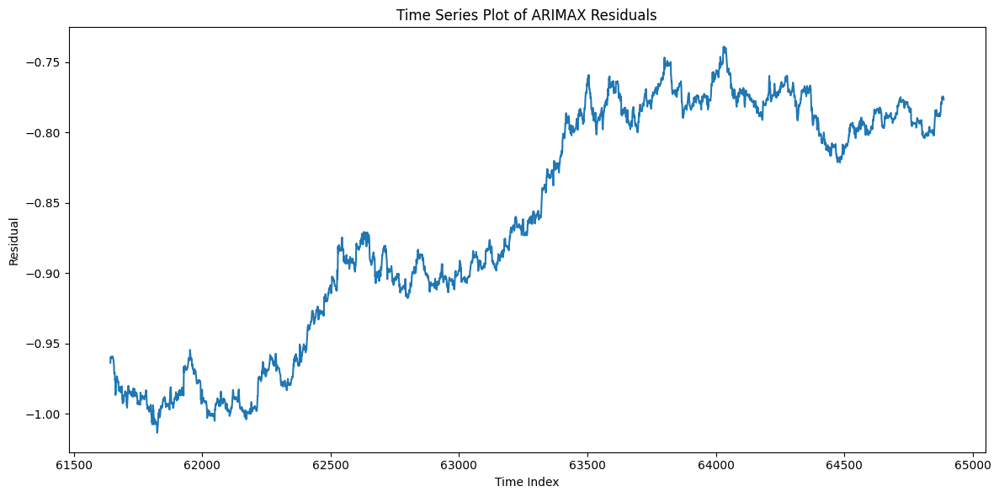

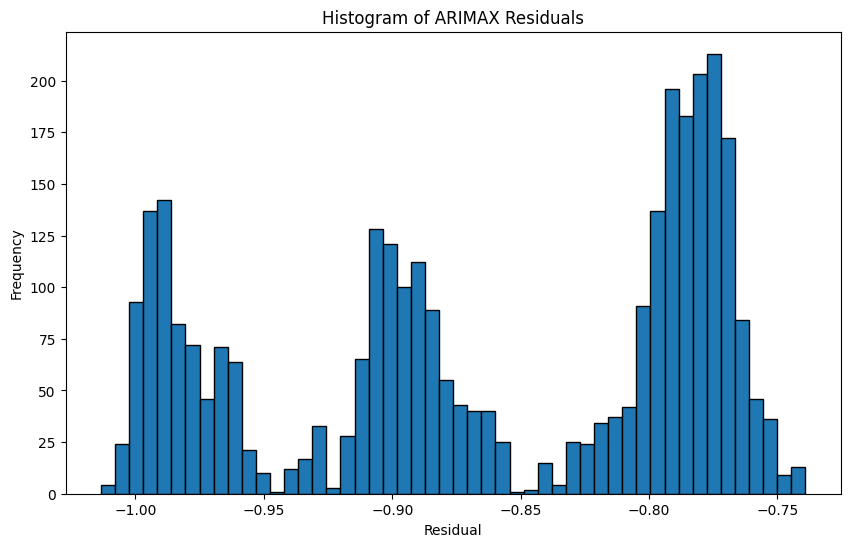

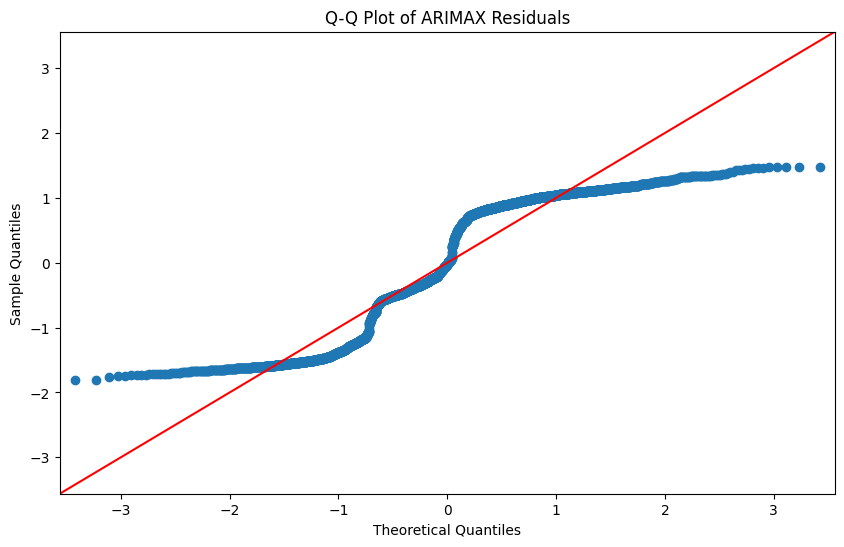

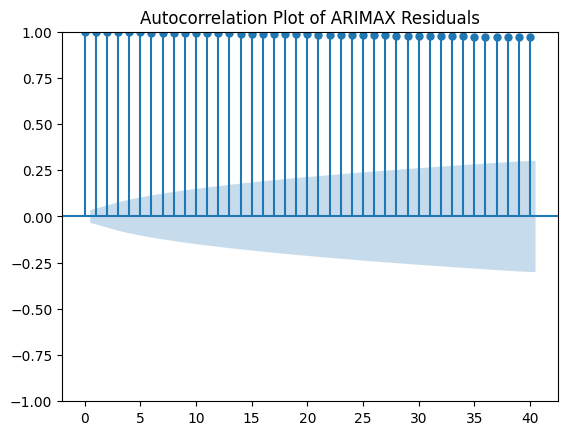

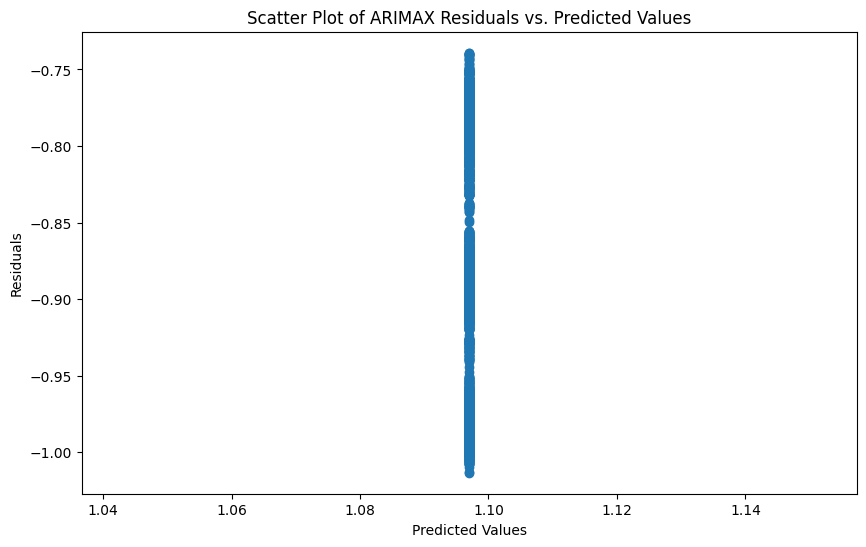

Shapiro-Wilk Test for Normality:
ShapiroResult(statistic=0.8830486832428346, pvalue=3.3166756192763527e-44)

Ljung-Box Test for Autocorrelation:
         lb_stat  lb_pvalue
10  32255.306056        0.0

Summary Statistics of Residuals:
count    3245.000000
mean       -0.862654
std         0.083323
min        -1.013473
25%        -0.927836
50%        -0.864619
75%        -0.784030
max        -0.739081
dtype: float64

Shapes:
y_test: (12977,)
y_pred: (3245,)
residuals: (3245,)


In [125]:
from scipy import stats

y_test_matched = y_test[-len(y_pred):]
residuals = y_test_matched - y_pred

# Create a DataFrame with the residuals
residuals_df = pd.DataFrame({'Residuals': residuals})

# 1. Time Series Plot of Residuals
plt.figure(figsize=(12, 6))
plt.plot(residuals_df.index, residuals_df['Residuals'])
plt.title('Time Series Plot of ARIMAX Residuals')
plt.xlabel('Time Index')
plt.ylabel('Residual')
plt.tight_layout()
plt.show()

# 2. Histogram of Residuals
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=50, edgecolor='black')
plt.title('Histogram of ARIMAX Residuals')
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.show()

# 3. Q-Q Plot
fig, ax = plt.subplots(figsize=(10, 6))
sm.qqplot(residuals, line='45', fit=True, ax=ax)
plt.title('Q-Q Plot of ARIMAX Residuals')
plt.show()

# 4. Autocorrelation Plot
sm.graphics.tsa.plot_acf(residuals, lags=40)
plt.title('Autocorrelation Plot of ARIMAX Residuals')
plt.show()

# 5. Scatter Plot of Residuals vs. Predicted Values
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals)
plt.title('Scatter Plot of ARIMAX Residuals vs. Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

# 6. Statistical Tests
print("Shapiro-Wilk Test for Normality:")
print(stats.shapiro(residuals))

print("\nLjung-Box Test for Autocorrelation:")
print(sm.stats.acorr_ljungbox(residuals, lags=[10], return_df=True))

# 7. Summary Statistics
print("\nSummary Statistics of Residuals:")
print(pd.Series(residuals).describe())

# 8. Print the shapes of y_test, y_pred, and residuals
print("\nShapes:")
print(f"y_test: {y_test.shape}")
print(f"y_pred: {y_pred.shape}")
print(f"residuals: {residuals.shape}")

In [101]:
df_combined = pd.DataFrame({
    'Date': df_hourly['Date'],
    'Train': y_train,
    'Test': y_test,
    'Predicted': y_pred
})

# Plot using Plotly Express
fig = px.line(df_combined, x='Date', y=['Train', 'Test', 'Predicted'],
              labels={'Train': 'Training Data', 'Test': 'Testing Data', 'Predicted': 'Predicted Data'},
              title='Train, Test and Predicted Closing Prices')

# Show the plot
fig.show()

##LSTM Approach

In [102]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error, mean_absolute_error
import plotly.graph_objs as go

In [103]:
df_hourly_dates =df_hourly.copy()
df_hourly = df_hourly.drop(['Date', 'Time'], axis=1)

In [104]:
# Scale the features using MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df_hourly)

In [105]:
X = scaled_data[:, df_hourly.columns != 'Close']  # All columns except 'Close' (features)
y = scaled_data[:, df_hourly.columns.get_loc('Close')]  # 'Close' price column as target

In [106]:
def create_sequences(X, y, time_steps=5):  # 5-year look-back period
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:i+time_steps])
        ys.append(y[i+time_steps])
    return np.array(Xs), np.array(ys)



In [107]:
# Set the time_steps to 5 (5 years look-back period)
time_steps = 5
X_seq, y_seq = create_sequences(X, y, time_steps)


In [108]:
X_train, X_test, y_train, y_test = train_test_split(X_seq, y_seq, test_size=0.2, shuffle=False)

In [109]:
model = Sequential()

# Add LSTM layers with dropout to prevent overfitting
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=False))
model.add(Dropout(0.2))

# Output layer (regression, so no activation function)
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Model summary
model.summary()


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                        │ (None, 5, 50)               │          13,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 5, 50)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 50)                  │          20,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 50)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              51 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 33,651 (131.45 KB)

 Trainable params: 33,651 (131.45 KB)

 Non-trainable params: 0 (0.00 B)

In [110]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 21s 9ms/step - loss: 0.0061 - val_loss: 4.5075e-05
Epoch 2/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 20s 9ms/step - loss: 0.0010 - val_loss: 2.1299e-05
Epoch 3/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 21s 9ms/step - loss: 6.3000e-04 - val_loss: 2.0718e-05
Epoch 4/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - loss: 4.9210e-04 - val_loss: 3.3884e-05
Epoch 5/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 23s 11ms/step - loss: 4.8127e-04 - val_loss: 1.4608e-05
Epoch 6/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 4.8767e-04 - val_loss: 7.8404e-04
Epoch 7/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - loss: 4.7998e-04 - val_loss: 3.0372e-04
Epoch 8/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 15s 9ms/step - loss: 4.5089e-04 - val_loss: 2.3669e-04
Epoch 9/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 4.4741e-04 - val_loss: 1.8258e-05
Epoch 10/20
1623/1623 ━━━━━━━━━━━━━━━━━━━━ 16s 10ms/step - loss: 4.4286e-04 - val_loss: 2.3870e-05
Epoch 11/20
1623/1623 ━━━━━━━━━━━

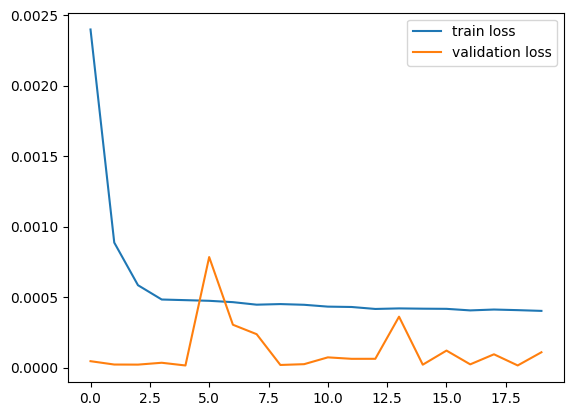

In [111]:
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

In [112]:
predicted_price = model.predict(X_test)

406/406 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


In [113]:
# Extract the 'Close' column for scaling separately
close_scaler = MinMaxScaler()

# Fit the scaler on the 'Close' price column only
close_scaled = close_scaler.fit_transform(df_hourly[['Close']])


In [114]:
actual_price_rescaled_train = close_scaler.inverse_transform(y_train.reshape(-1, 1))

# Make predictions (assuming 'predicted_price' is already computed by the model)
predicted_price_rescaled = close_scaler.inverse_transform(predicted_price)

# Rescale the actual closing prices
actual_price_rescaled_test = close_scaler.inverse_transform(y_test.reshape(-1, 1))

In [115]:
mse = mean_squared_error(actual_price_rescaled_test, predicted_price_rescaled)
mae = mean_absolute_error(actual_price_rescaled_test, predicted_price_rescaled)

print(f'MSE: {mse}')
print(f'MAE: {mae}')


MSE: 2.2705068169431048e-05
MAE: 0.0045147283707523385


In [116]:
date_data = df_hourly_dates['Date']

In [117]:
train_df = pd.DataFrame({
    'Date': date_data[:len(y_train)],
    'Close_Train': actual_price_rescaled_train.flatten()
})

test_df = pd.DataFrame({
    'Date': date_data[len(y_train):len(y_train) + len(y_test)],
    'Close_Test': actual_price_rescaled_test.flatten(),
    'Predicted_Close': predicted_price_rescaled.flatten()
})

# Create Plotly traces
trace_train = go.Scatter(x=train_df['Date'], y=train_df['Close_Train'], mode='lines', name='Y_train')
trace_test = go.Scatter(x=test_df['Date'], y=test_df['Close_Test'], mode='lines', name='Y_test', line=dict(color='blue'))
trace_pred = go.Scatter(x=test_df['Date'], y=test_df['Predicted_Close'], mode='lines', name='Y_pred', line=dict(color='red', dash='dash'))

# Layout configuration
layout = go.Layout(
    title="Y_train, Y_test, and Y_pred vs Date",
    xaxis=dict(title='Date'),
    yaxis=dict(title='Close Price'),
    hovermode='x unified'
)

# Create the figure
fig = go.Figure(data=[trace_train, trace_test, trace_pred], layout=layout)

# Show the interactive plot
fig.show()